## Final Project Submission

Please fill out:
* Student name: 
* Student pace: self paced / part time / full time
* Scheduled project review date/time: 
* Instructor name: 
* Blog post URL:


# Import Libraries

In [1]:
import jupyternotify
ip = get_ipython()
ip.register_magics(jupyternotify.JupyterNotifyMagics)
# Run %notify to create notification for completed cell

import datetime
import numpy as np
import pandas as pd
import warnings

from keras import layers
from keras import models 
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from keras.utils import to_categorical 
from matplotlib.pyplot import imshow
from PIL import Image
from scipy import ndimage

import tensorflow as tf
from keras.callbacks import TensorBoard
from keras.layers import Conv2D, MaxPool2D, Dense, Dropout, Flatten
from keras.models import Sequential

import matplotlib.pyplot as plt
import seaborn as sns

#!pip install cufflinks
import cufflinks as cf
import plotly.offline as plyo

plyo.init_notebook_mode(connected=True)

%matplotlib inline
warnings.filterwarnings(action='ignore', category=FutureWarning)

start = datetime.datetime.now()

<IPython.core.display.Javascript object>

Using TensorFlow backend.


# Set Up DataFrame with Necessary Information
### Parse Dates for Appropriate Column
### Look at Descriptive Information (Nulls, Stats, etc)

In [2]:
df = pd.read_csv('AAPL.csv', parse_dates=[0], index_col='Date')
df.head(10)

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2000-01-03,3.745536,4.017857,3.631696,3.997768,2.665724,133949200
2000-01-04,3.866071,3.950893,3.613839,3.660714,2.440975,128094400
2000-01-05,3.705357,3.948661,3.678571,3.714286,2.476697,194580400
2000-01-06,3.790179,3.821429,3.392857,3.392857,2.262367,191993200
2000-01-07,3.446429,3.607143,3.410714,3.553571,2.369532,115183600
2000-01-10,3.642857,3.651786,3.383929,3.491071,2.327857,126266000
2000-01-11,3.426339,3.549107,3.232143,3.312500,2.208785,110387200
2000-01-12,3.392857,3.410714,3.089286,3.113839,2.076318,244017200
2000-01-13,3.374439,3.526786,3.303571,3.455357,2.304043,258171200


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4779 entries, 2000-01-03 to 2018-12-31
Data columns (total 6 columns):
Open         4779 non-null float64
High         4779 non-null float64
Low          4779 non-null float64
Close        4779 non-null float64
Adj Close    4779 non-null float64
Volume       4779 non-null int64
dtypes: float64(5), int64(1)
memory usage: 261.4 KB


In [4]:
df.describe()

,Open,High,Low,Close,Adj Close,Volume
count,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4.779000e+03
mean,51.668316,52.154108,51.146216,51.659933,45.028064,1.195246e+08
std,55.940933,56.402391,55.465148,55.940578,54.786612,9.922412e+07
min,0.927857,0.942143,0.908571,0.937143,0.624890,9.835000e+06
25%,4.369420,4.466518,4.213169,4.358814,2.906471,5.211620e+07
50%,26.139999,26.557142,25.671429,26.111429,17.411180,9.299220e+07
75%,90.657856,91.452145,89.739284,90.550713,68.549671,1.560167e+08
max,230.779999,233.470001,229.779999,232.070007,230.275482,1.855410e+09


In [83]:
df.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,2000-01-03,3.745536,4.017857,3.631696,3.997768,2.665724,133949200
1,2000-01-04,3.866071,3.950893,3.613839,3.660714,2.440975,128094400
2,2000-01-05,3.705357,3.948661,3.678571,3.714286,2.476697,194580400
3,2000-01-06,3.790179,3.821429,3.392857,3.392857,2.262367,191993200
4,2000-01-07,3.446429,3.607143,3.410714,3.553571,2.369532,115183600


In [84]:
years = [2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 
        2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018]
print(years)

[2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018]


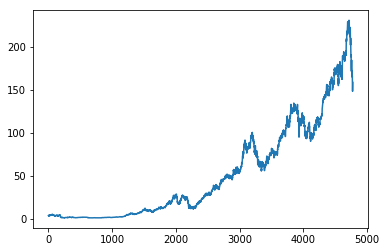

In [85]:
df.Open.plot()

# Interactive Plots of Apple Stock Data

In [86]:
plyo.iplot(
    df.iplot(asFigure=True),
    # image = 'png', 
    filename='ply_01')

In [87]:
plyo.iplot(
    df.iplot(subplots=True, 
    asFigure=True), 
    filename='ply_02')

In [88]:
qf = cf.QuantFig(df, 
                title = 'Apple Stock 2000-2018', 
                legend='top', 
                name='AAPL')
plyo.iplot(qf.iplot(asFigure=True),
           image='png',
          filename='qf_01')

In [89]:
qf.add_bollinger_bands(periods=15, boll_std=3)
plyo.iplot(qf.iplot(asFigure=True), filename='qf_02')

In [90]:
qf.add_rsi(periods=14, showbands=False)
plyo.iplot(qf.iplot(asFigure=True), filename='qf_03')

In [13]:
df.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2000-01-03,3.745536,4.017857,3.631696,3.997768,2.665724,133949200
2000-01-04,3.866071,3.950893,3.613839,3.660714,2.440975,128094400
2000-01-05,3.705357,3.948661,3.678571,3.714286,2.476697,194580400
2000-01-06,3.790179,3.821429,3.392857,3.392857,2.262367,191993200
2000-01-07,3.446429,3.607143,3.410714,3.553571,2.369532,115183600


In [14]:
train = df[df.index < '2010-12-31']
test = df[df.index >= '2010-12-31']

In [15]:
train.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2000-01-03,3.745536,4.017857,3.631696,3.997768,2.665724,133949200
2000-01-04,3.866071,3.950893,3.613839,3.660714,2.440975,128094400
2000-01-05,3.705357,3.948661,3.678571,3.714286,2.476697,194580400
2000-01-06,3.790179,3.821429,3.392857,3.392857,2.262367,191993200
2000-01-07,3.446429,3.607143,3.410714,3.553571,2.369532,115183600


In [16]:
test.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2010-12-31,46.135715,46.211430,45.901428,46.080002,30.726294,48377000
2011-01-03,46.520000,47.180000,46.405716,47.081429,31.394041,111284600
2011-01-04,47.491428,47.500000,46.878571,47.327145,31.557884,77270200
2011-01-05,47.078571,47.762856,47.071430,47.714287,31.816027,63879900
2011-01-06,47.817142,47.892857,47.557144,47.675713,31.790306,75107200


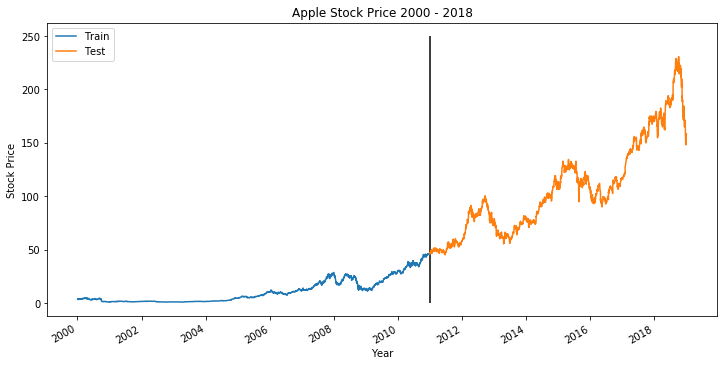

In [17]:
plt.figure(figsize=(12,6))
train.Open.plot(label='Train')
test.Open.plot(label='Test')
plt.vlines('2011', ymin=0, ymax=250)
plt.xlabel('Year')
plt.ylabel('Stock Price')
plt.title('Apple Stock Price 2000 - 2018')
plt.legend(loc=0)

# Test Set, DROP ALL BUT OPEN & CLOSE COLUMN

In [18]:
test = test[['Open', 'Close']]
test.head()

,Open,Close
Date,,
2010-12-31,46.135715,46.080002
2011-01-03,46.520000,47.081429
2011-01-04,47.491428,47.327145
2011-01-05,47.078571,47.714287
2011-01-06,47.817142,47.675713


# Look at Simple Moving Average (SMA)

In [19]:
SMA1 = 42 # Shorter Simple Moving Average
SMA2 = 252 # Longer Simple Moving Average

In [20]:
test['SMA1'] = test.Close.rolling(SMA1).mean()
test['SMA2'] = test.Close.rolling(SMA2).mean()

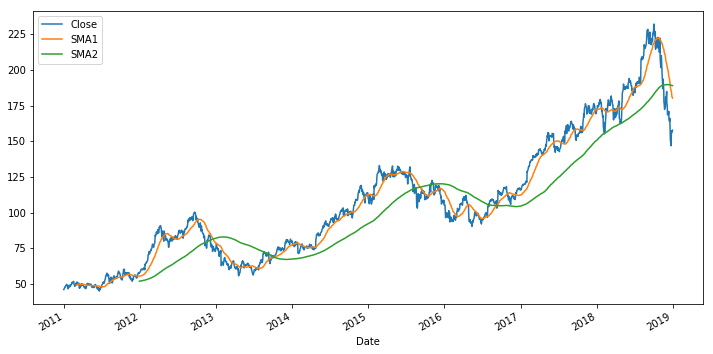

In [21]:
plt.figure(figsize=(12,6))
test.Close.plot()
test.SMA1.plot()
test.SMA2.plot()
plt.legend(loc=0)

In [22]:
test['Position'] = np.where(test['SMA1'] > test['SMA2'], 1, -1)

In [23]:
test.dropna(inplace=True)

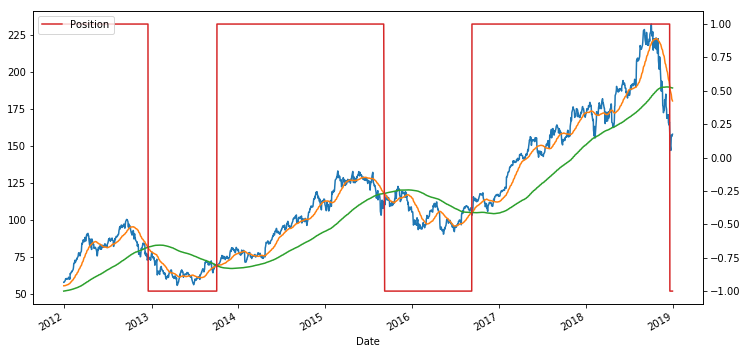

In [24]:
plt.figure(figsize=(12,6))
test.Close.plot()
plt.plot(test.SMA1, label='SMA1')
plt.plot(test.SMA2)
test.Position.plot(secondary_y='Position')
plt.legend(loc=2)

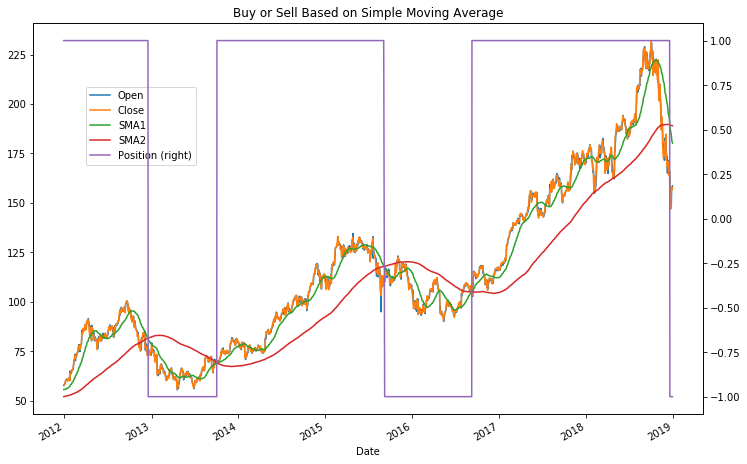

In [25]:
ax = test.plot(secondary_y='Position', figsize=(12,8), title='Buy or Sell Based on Simple Moving Average')
ax.get_legend().set_bbox_to_anchor((0.25, 0.85));

In [26]:
test['Returns'] = np.log(test.Close / test.Close.shift(1))

In [27]:
test['Strategy'] = test.Position.shift(1) * test.Returns

In [28]:
test.round(4).head()

,Open,Close,SMA1,SMA2,Position,Returns,Strategy
Date,,,,,,,
2011-12-29,57.6286,57.8743,55.5525,51.9539,1,NaN,NaN
2011-12-30,57.6443,57.8571,55.5533,52.0006,1,-0.0003,-0.0003
2012-01-03,58.4857,58.7471,55.6033,52.0469,1,0.0153,0.0153
2012-01-04,58.5714,59.0629,55.6579,52.0935,1,0.0054,0.0054
2012-01-05,59.2786,59.7186,55.7087,52.1411,1,0.0110,0.0110


In [29]:
test.dropna(inplace=True)

In [30]:
np.exp(test[['Returns', 'Strategy']].sum())

Returns     2.725563
Strategy    3.897501
dtype: float64

In [31]:
test[['Returns', 'Strategy']].std() * 252 ** 0.5

Returns     0.255180
Strategy    0.255045
dtype: float64

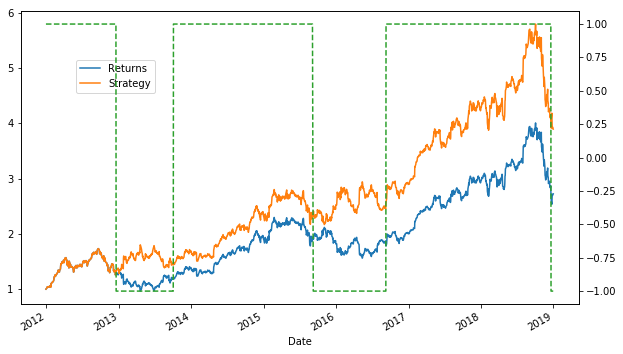

In [32]:
ax = test[['Returns', 'Strategy']].cumsum().apply(np.exp).plot(figsize=(10,6))
test['Position'].plot(ax=ax, secondary_y='Position', style='--')
ax.get_legend().set_bbox_to_anchor((0.25, 0.85));

In [33]:
from itertools import product

In [34]:
sma1 = range(20, 61, 4)
sma2 = range(180, 281, 10)

In [35]:
results = pd.DataFrame()
for SMA1, SMA2 in product(sma1, sma2):
    data = pd.DataFrame(test)
    data.dropna(inplace=True)
    data['Returns'] = np.log(data['Close'] / data['Close'].shift(1))
    data['SMA1'] = data['Close'].rolling(SMA1).mean()
    data['SMA2'] = data['Close'].rolling(SMA2).mean()
    data.dropna(inplace=True)
    data['Position'] = np.where(data['SMA1'] > data['SMA2'], 1, -1)
    data['Strategy'] = data['Position'].shift(1) * data['Returns']
    data.dropna(inplace=True)
    perf = np.exp(data[['Returns', 'Strategy']].sum())
    results = results.append(pd.DataFrame(
                {'SMA1': SMA1, 'SMA2': SMA2,
                 'MARKET': perf['Returns'], 
                 'STRATEGY': perf['Strategy'],
                 'OUT': perf['Strategy'] - perf['Returns']},
                index=[0]), ignore_index=True)

In [36]:
results.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 121 entries, 0 to 120
Data columns (total 5 columns):
SMA1        121 non-null int64
SMA2        121 non-null int64
MARKET      121 non-null float64
STRATEGY    121 non-null float64
OUT         121 non-null float64
dtypes: float64(3), int64(2)
memory usage: 4.8 KB


In [37]:
results.sort_values('OUT', ascending=False).head(7)

,SMA1,SMA2,MARKET,STRATEGY,OUT
5,20,230,1.873524,3.814147,1.940623
39,32,240,2.084578,3.638602,1.554024
15,24,220,2.056661,3.582361,1.525701
59,40,220,2.056661,3.534880,1.478219
14,24,210,1.854767,3.264606,1.409839
46,36,200,1.739524,3.134737,1.395213
56,40,190,1.674548,3.034537,1.359989


In [38]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4779 entries, 2000-01-03 to 2018-12-31
Data columns (total 6 columns):
Open         4779 non-null float64
High         4779 non-null float64
Low          4779 non-null float64
Close        4779 non-null float64
Adj Close    4779 non-null float64
Volume       4779 non-null int64
dtypes: float64(5), int64(1)
memory usage: 261.4 KB


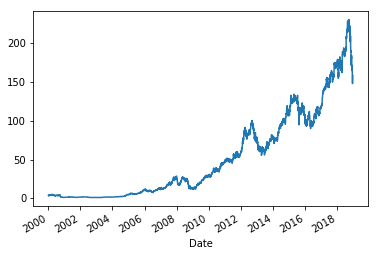

In [39]:
df.Open.plot()

In [40]:
data = pd.read_csv('.SPX.csv', parse_dates=[0], index_col='Date')
data.drop(columns=['Open', 'High', 'Low', 'Adj Close', 'Volume'], inplace=True)
data.head(7)

,Close
Date,
2010-01-04,1132.989990
2010-01-05,1136.520020
2010-01-06,1137.140015
2010-01-07,1141.689941
2010-01-08,1144.979980
2010-01-11,1146.979980
2010-01-12,1136.219971


In [41]:
lags = 5
cols = []
for lag in range(1, lags + 1):
    col = 'lag_{}'.format(lag)
    data[col] = data.Close.shift(lag)
    cols.append(col)

In [42]:
data.head(7)

,Close,lag_1,lag_2,lag_3,lag_4,lag_5
Date,,,,,,
2010-01-04,1132.989990,NaN,NaN,NaN,NaN,NaN
2010-01-05,1136.520020,1132.989990,NaN,NaN,NaN,NaN
2010-01-06,1137.140015,1136.520020,1132.989990,NaN,NaN,NaN
2010-01-07,1141.689941,1137.140015,1136.520020,1132.989990,NaN,NaN
2010-01-08,1144.979980,1141.689941,1137.140015,1136.520020,1132.989990,NaN
2010-01-11,1146.979980,1144.979980,1141.689941,1137.140015,1136.520020,1132.98999
2010-01-12,1136.219971,1146.979980,1144.979980,1141.689941,1137.140015,1136.52002


In [43]:
data.dropna(inplace=True)

In [44]:
df.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2000-01-03,3.745536,4.017857,3.631696,3.997768,2.665724,133949200
2000-01-04,3.866071,3.950893,3.613839,3.660714,2.440975,128094400
2000-01-05,3.705357,3.948661,3.678571,3.714286,2.476697,194580400
2000-01-06,3.790179,3.821429,3.392857,3.392857,2.262367,191993200
2000-01-07,3.446429,3.607143,3.410714,3.553571,2.369532,115183600


In [45]:
df['returns'] = np.log(df.Close / df.Close.shift(1))

In [46]:
df['direction'] = np.sign(df['returns'])

In [47]:
df.head(10)

,Open,High,Low,Close,Adj Close,Volume,returns,direction
Date,,,,,,,,
2000-01-03,3.745536,4.017857,3.631696,3.997768,2.665724,133949200,NaN,NaN
2000-01-04,3.866071,3.950893,3.613839,3.660714,2.440975,128094400,-0.088078,-1.0
2000-01-05,3.705357,3.948661,3.678571,3.714286,2.476697,194580400,0.014528,1.0
2000-01-06,3.790179,3.821429,3.392857,3.392857,2.262367,191993200,-0.090514,-1.0
2000-01-07,3.446429,3.607143,3.410714,3.553571,2.369532,115183600,0.046281,1.0
2000-01-10,3.642857,3.651786,3.383929,3.491071,2.327857,126266000,-0.017744,-1.0
2000-01-11,3.426339,3.549107,3.232143,3.312500,2.208785,110387200,-0.052505,-1.0
2000-01-12,3.392857,3.410714,3.089286,3.113839,2.076318,244017200,-0.061847,-1.0
2000-01-13,3.374439,3.526786,3.303571,3.455357,2.304043,258171200,0.104069,1.0


In [48]:
train = df[df.index < '2010-1-1']
test = df[df.index >= '2010-1-1']

# Build Neural Network

In [49]:
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential, load_model
from keras.layers import LSTM, Dense, Dropout
import os

In [50]:
df = pd.read_csv('AAPL.csv', parse_dates=[0], index_col = 'Date')
df.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2000-01-03,3.745536,4.017857,3.631696,3.997768,2.665724,133949200
2000-01-04,3.866071,3.950893,3.613839,3.660714,2.440975,128094400
2000-01-05,3.705357,3.948661,3.678571,3.714286,2.476697,194580400
2000-01-06,3.790179,3.821429,3.392857,3.392857,2.262367,191993200
2000-01-07,3.446429,3.607143,3.410714,3.553571,2.369532,115183600


In [51]:
df = df['Open'].values
df = df.reshape(-1, 1)
print(df.shape)
df[:5]

(4779, 1)


array([[3.745536],
       [3.866071],
       [3.705357],
       [3.790179],
       [3.446429]])

In [52]:
df_train = np.array(df[:int(df.shape[0]*0.6)])
df_test = np.array(df[int(df.shape[0]*0.6)-50:])
print(df_train.shape)
print(df_test.shape)

(2867, 1)
(1962, 1)


In [53]:
scaler = MinMaxScaler(feature_range=(0,1))
df_train = scaler.fit_transform(df_train)
df_train[:5]

array([[0.05557474],
       [0.05795212],
       [0.05478227],
       [0.05645526],
       [0.04967528]])

In [54]:
df_test = scaler.fit_transform(df_test)
df_test[:5]

array([[0.01949521],
       [0.01551455],
       [0.01574554],
       [0.0148678 ],
       [0.01992637]])

In [55]:
def create_dataset(df):
    x = []
    y = []
    for i in range(50, df.shape[0]):
        x.append(df[i-50:i, 0])
        y.append(df[i, 0])
    x = np.array(x)
    y = np.array(y)
    return x,y

In [56]:
x_train, y_train = create_dataset(df_train)
x_train[:1]

array([[0.05557474, 0.05795212, 0.05478227, 0.05645526, 0.04967528,
        0.05354954, 0.04927903, 0.04861864, 0.04825538, 0.05214073,
        0.05284513, 0.05610304, 0.06305913, 0.06217861, 0.05808421,
        0.05566279, 0.05918485, 0.05834837, 0.0579081 , 0.05284513,
        0.05495838, 0.05266902, 0.05236084, 0.05491435, 0.05777603,
        0.06200252, 0.06209057, 0.06121005, 0.06173836, 0.05870057,
        0.06288302, 0.06464406, 0.062839  , 0.06244277, 0.05927291,
        0.06146314, 0.06433588, 0.06257484, 0.05927291, 0.06169434,
        0.0652164 , 0.07115989, 0.069663  , 0.07045548, 0.07076366,
        0.06825419, 0.06684535, 0.06741769, 0.06772587, 0.06708746]])

In [57]:
x_test, y_test = create_dataset(df_test)
x_test[:1]

array([[0.01949521, 0.01551455, 0.01574554, 0.0148678 , 0.01992637,
        0.01740093, 0.0193797 , 0.02416882, 0.02808019, 0.02385314,
        0.0261476 , 0.0228522 , 0.02650949, 0.02127379, 0.01563775,
        0.01889465, 0.01649238, 0.01789371, 0.01338178, 0.01063304,
        0.01412094, 0.01395154, 0.01279661, 0.00725294, 0.01264261,
        0.02065784, 0.02950461, 0.02591663, 0.02844207, 0.02737953,
        0.02272132, 0.02317559, 0.02545464, 0.02410722, 0.02431511,
        0.0244229 , 0.02541615, 0.02400714, 0.02480018, 0.02490029,
        0.02266741, 0.02231324, 0.01733933, 0.01179567, 0.01523736,
        0.01955681, 0.01761653, 0.01023268, 0.0144905 , 0.01289671]])

In [58]:
x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))
x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))
print(x_train.shape)
print(x_test.shape)

(2817, 50, 1)
(1912, 50, 1)


In [59]:
model_acc = Sequential()
model_acc.add(LSTM(units=96, return_sequences=True, input_shape=(x_train.shape[1], 1)))
model_acc.add(Dropout(0.2))
model_acc.add(LSTM(units=96, return_sequences=True))
model_acc.add(Dropout(0.2))
model_acc.add(LSTM(units=96, return_sequences=True))
model_acc.add(Dropout(0.2))
model_acc.add(LSTM(units=96))
model_acc.add(Dropout(0.2))
model_acc.add(Dense(units=1))

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


In [60]:
model_acc.compile(loss='mean_squared_error', optimizer='adam', metrics=['accuracy'])

In [61]:
if(not os.path.exists('stock_prediction_acc.h5')):
    model.fit(x_train, y_train, epochs=50, batch_size=32, validation_split=0.2)
    model.save('stock_prediction_acc.h5')

In [62]:
model = load_model('stock_prediction_acc.h5')

Instructions for updating:
Use tf.cast instead.


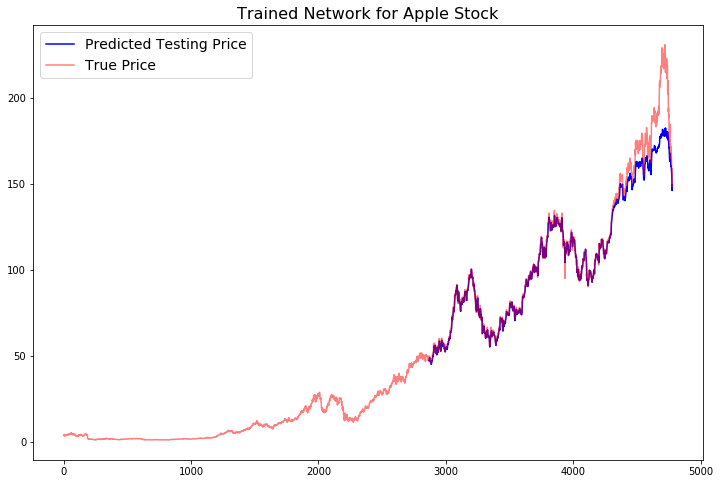

In [63]:
predictions = model.predict(x_test)
predictions = scaler.inverse_transform(predictions)

fig, ax = plt.subplots(figsize=(12,8))
ax.plot(range(len(y_train)+50,len(y_train)+50+len(predictions)),predictions, 
        color='blue', label='Predicted Testing Price')
plt.plot(df, color='red',  label="True Price", alpha=0.5)
plt.title('Trained Network for Apple Stock', fontsize=16)
plt.legend(fontsize=14)

In [64]:
print(model.metrics_names)
scores = model.evaluate(x_test, y_test)
scores[1]*100

['loss', 'acc']
1912/1912 [==============================] - 2s 1ms/step


0.10460251046025104

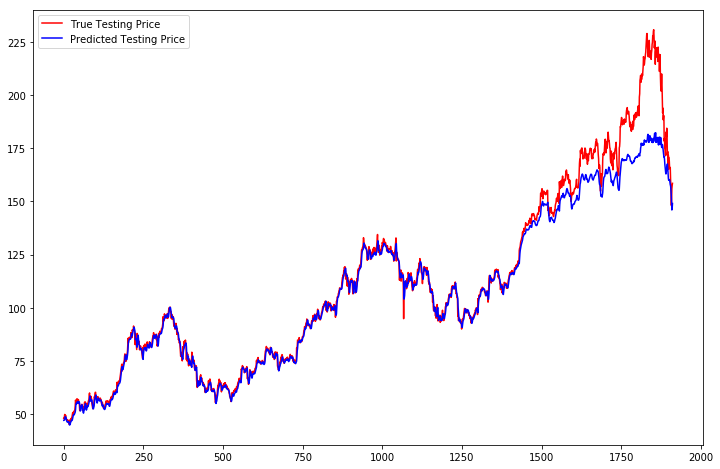

In [65]:
y_test_scaled = scaler.inverse_transform(y_test.reshape(-1, 1))

fig, ax = plt.subplots(figsize=(12,8))
ax.plot(y_test_scaled, color='red', label='True Testing Price')
plt.plot(predictions, color='blue', label='Predicted Testing Price')
plt.legend()

In [66]:
df = pd.read_csv('AAPL.csv', parse_dates=[0], index_col='Date')
df.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2000-01-03,3.745536,4.017857,3.631696,3.997768,2.665724,133949200
2000-01-04,3.866071,3.950893,3.613839,3.660714,2.440975,128094400
2000-01-05,3.705357,3.948661,3.678571,3.714286,2.476697,194580400
2000-01-06,3.790179,3.821429,3.392857,3.392857,2.262367,191993200
2000-01-07,3.446429,3.607143,3.410714,3.553571,2.369532,115183600


In [67]:
df.Volume.max()

1855410200

# Look at Important Dates for Stock Data

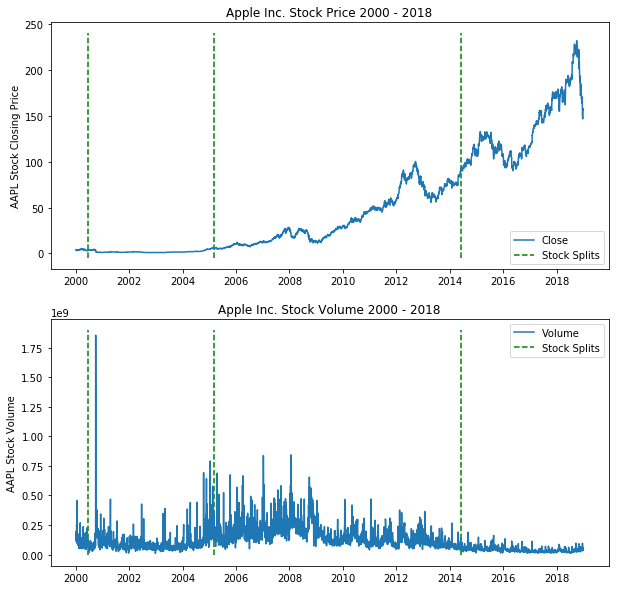

In [68]:
plt.figure(figsize=(10,10))
plt.subplot(211)
plt.plot(df.Close, lw=1.5)
plt.ylabel('AAPL Stock Closing Price')
plt.title('Apple Inc. Stock Price 2000 - 2018')
plt.vlines(['2000-06-21', '2005-02-28', '2014-06-09'], ymin=-5, ymax=240, linestyles='dashed', 
           colors='g', label='Stock Splits')
plt.legend(loc=4)
plt.subplot(212)
plt.plot(df.Volume)
plt.ylabel('AAPL Stock Volume')
plt.title('Apple Inc. Stock Volume 2000 - 2018')
plt.vlines(['2000-06-21', '2005-02-28', '2014-06-09'], ymin=-5, ymax=1900000000, linestyles='dashed', 
           colors='g', label='Stock Splits')
plt.legend(loc=0)
plt.show()

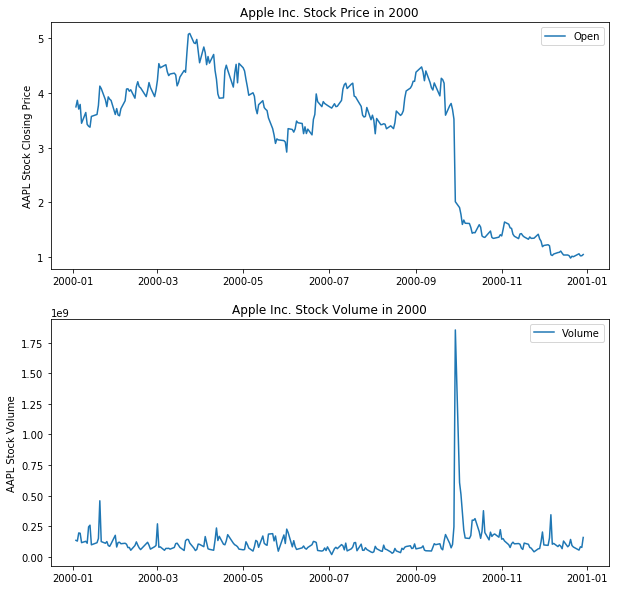

In [69]:
plt.figure(figsize=(10,10))
plt.subplot(211)
plt.plot(df['2000'].Open, lw=1.5)
plt.legend(loc=0)
plt.ylabel('AAPL Stock Closing Price')
plt.title('Apple Inc. Stock Price in 2000')
plt.subplot(212)
plt.plot(df['2000'].Volume)
plt.ylabel('AAPL Stock Volume')
plt.title('Apple Inc. Stock Volume in 2000')
plt.legend(loc=0)
plt.show()

In [70]:
releases = {}
releases['2000'] = ['February 16', 'July 19', 'September 13']
releases['2001'] = ['January', 'May 1', 'July 18', 'September 8', 'October 23']
releases['2002'] = ['January 7', 'April 29', 'May 14', 'July 17', 'August 13', 'August 27']
releases['2003'] = ['January 7', 'February 10', 'April 28', 'June 23', 'September 16', 'October 22', 'November 18']
releases['2004'] = ['January 6', 'January 8', 'June 7', 'June 9', 'June 28', 'July 19', 'August 31', 'September 26']
releases['2005'] = ['January 11', 'February 23', 'September 7', 'October 12', 'October 19']
releases['2006'] = ['January 10', 'February 14', 'February 28', 'April 24', 'May 16', 'July 13', 'August 7',
                   'September 6', 'September 12', 'September 25']
releases['2007'] = ['March 21', 'June 29', 'August 7', 'September 5']
releases['2008'] = ['January 8', 'January 15', 'February 5', 'February 26', 'February 27', 'February 29', 'March 17', 
                   'April 28', 'July 11', 'September 9', 'October 14']
releases['2009'] = ['January 6', 'January 29', 'March 3', 'March 11', 'April 7', 'May 27', 'June 8', 'June 19', 
                   'July 30', 'September 9', 'October 20']
releases['2010'] = ['March 31', 'April 3', 'April 13', 'April 30', 'May 18', 'June 15', 'June 24', 'July 27', 
                   'August 9', 'September 1', 'October 20']
releases['2011'] = ['February 10', 'February 24', 'March 11', 'May 3', 'June 21', 'July 20', 'October 14', 'October 24']
releases['2012'] = ['March 16', 'June 11', 'September 12', 'September 21', 'October 11', 'October 23', 'November 2',
                   'November 16', 'November 30', 'December']
releases['2013'] = ['January 28', 'February 13', 'May 30', 'June 10', 'September 20', 'September 20', 'October 22', 
                   'November 1', 'November 12', 'December 19']
releases['2014'] = ['March 18', 'April 29', 'June 18', 'June 26', 'July 29', 'September 19', 'October 16', 'October 22']
releases['2015'] = ['March 9', 'April 10', 'April 24', 'May 19', 'July 15', 'September 9', 'September 25', 
                   'October 13', 'October 26', 'November 11']
releases['2016'] = ['March 31', 'April 19', 'September 7', 'September 16', 'October 27', 'October 28', 'December 19']
releases['2017'] = ['March 21', 'March 24', 'June 5', 'September 22', 'November 3', 'December 14']
releases['2018'] = ['February 9', 'March 27', 'July 12', 'September 21', 'September 21', 'November 7']

In [71]:
df = pd.read_csv('AAPL.csv', parse_dates=[0])
df.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,2000-01-03,3.745536,4.017857,3.631696,3.997768,2.665724,133949200
1,2000-01-04,3.866071,3.950893,3.613839,3.660714,2.440975,128094400
2,2000-01-05,3.705357,3.948661,3.678571,3.714286,2.476697,194580400
3,2000-01-06,3.790179,3.821429,3.392857,3.392857,2.262367,191993200
4,2000-01-07,3.446429,3.607143,3.410714,3.553571,2.369532,115183600


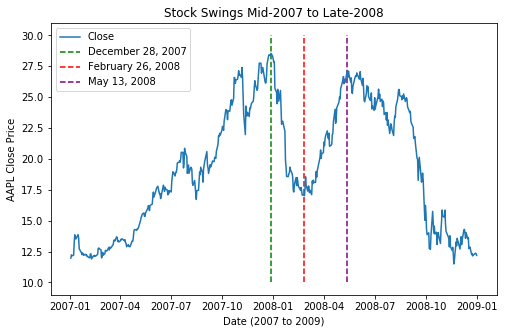

In [72]:
mask = (df['Date'] >= '2007') & (df['Date'] <= '2009')
y0709 = df.loc[mask]
y0709 = y0709.set_index(['Date'])
plt.figure(figsize=(8,5))
plt.plot(y0709.Close)
plt.vlines('2007-12-28', ymin=10, ymax=30, linestyles='dashed', colors='g', label='December 28, 2007')
plt.vlines('2008-02-26', ymin=10, ymax=30, linestyles='dashed', colors='r', label='February 26, 2008')
plt.vlines('2008-05-13', ymin=10, ymax=30, linestyles='dashed', colors='purple', label='May 13, 2008')
plt.title('Stock Swings Mid-2007 to Late-2008')
plt.xlabel('Date (2007 to 2009)')
plt.ylabel('AAPL Close Price')
plt.legend(loc=0)

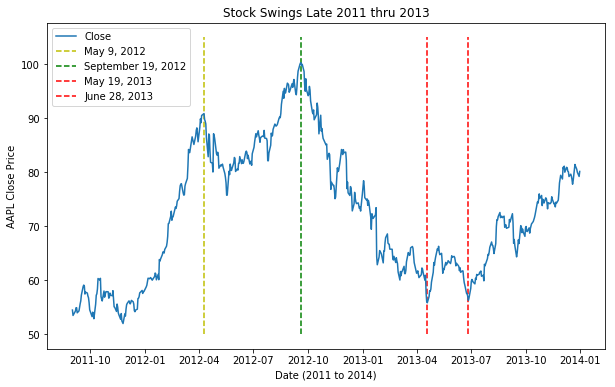

In [73]:
mask = (df['Date'] >= '2011-09') & (df['Date'] <= '2014')
y1114 = df.loc[mask]
y1114 = y1114.set_index(['Date'])
plt.figure(figsize=(10,6))
plt.plot(y1114.Close)
plt.vlines('2012-04-09', ymin=50, ymax=105, linestyles='dashed', colors='y', label='May 9, 2012')
plt.vlines('2012-09-19', ymin=50, ymax=105, linestyles='dashed', colors='g', label='September 19, 2012')
plt.vlines('2013-04-19', ymin=50, ymax=105, linestyles='dashed', colors='r', label='May 19, 2013')
plt.vlines('2013-06-27', ymin=50, ymax=105, linestyles='dashed', colors='r', label='June 28, 2013')
plt.title('Stock Swings Late 2011 thru 2013')
plt.xlabel('Date (2011 to 2014)')
plt.ylabel('AAPL Close Price')
plt.legend(loc=2)

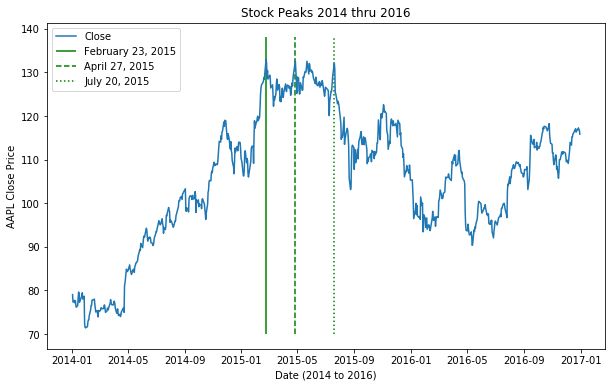

In [74]:
mask = (df['Date'] >= '2014') & (df['Date'] <= '2017')
y1416 = df.loc[mask]
y1416 = y1416.set_index(['Date'])
plt.figure(figsize=(10,6))
plt.plot(y1416.Close)
plt.vlines('2015-02-23', ymin=70, ymax=138, linestyles='solid', colors='g', label='February 23, 2015')
plt.vlines('2015-04-27', ymin=70, ymax=138, linestyles='dashed', colors='g', label='April 27, 2015')
plt.vlines('2015-07-20', ymin=70, ymax=138, linestyles='dotted', colors='g', label='July 20, 2015')
plt.title('Stock Peaks 2014 thru 2016')
plt.xlabel('Date (2014 to 2016)')
plt.ylabel('AAPL Close Price')
plt.legend(loc=2)

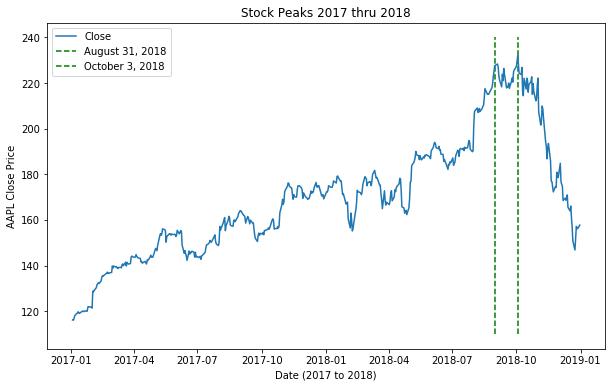

In [75]:
mask = (df['Date'] >= '2017')
y1718 = df.loc[mask]
y1718 = y1718.set_index(['Date'])
plt.figure(figsize=(10,6))
plt.plot(y1718.Close)
plt.vlines('2018-08-31', ymin=110, ymax=240, linestyles='dashed', colors='g', label='August 31, 2018')
plt.vlines('2018-10-03', ymin=110, ymax=240, linestyles='dashed', colors='g', label='October 3, 2018')
plt.title('Stock Peaks 2017 thru 2018')
plt.xlabel('Date (2017 to 2018)')
plt.ylabel('AAPL Close Price')
plt.legend(loc=2)

In [76]:
y1718['2018-08'].Close

Date
2018-08-01    201.500000
2018-08-02    207.389999
2018-08-03    207.990005
2018-08-06    209.070007
2018-08-07    207.110001
2018-08-08    207.250000
2018-08-09    208.880005
2018-08-10    207.529999
2018-08-13    208.869995
2018-08-14    209.750000
2018-08-15    210.240005
2018-08-16    213.320007
2018-08-17    217.580002
2018-08-20    215.460007
2018-08-21    215.039993
2018-08-22    215.050003
2018-08-23    215.490005
2018-08-24    216.160004
2018-08-27    217.940002
2018-08-28    219.699997
2018-08-29    222.979996
2018-08-30    225.029999
2018-08-31    227.630005
Name: Close, dtype: float64